In [1]:
from datasets import load_dataset

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset = load_dataset("imagefolder", data_dir="../img")

Generating train split: 160 examples [00:00, 1724.72 examples/s]


In [4]:
dataset["train"].features

{'image': Image(mode=None, decode=True, id=None),
 'label': ClassLabel(names=['CHEVROLET_BOLT', 'KIA_NIRO', 'NISSAN_LEAF', 'RIVIAN_R1T', 'TESLA_3', 'TESLA_S', 'TESLA_X', 'TESLA_Y'], id=None)}

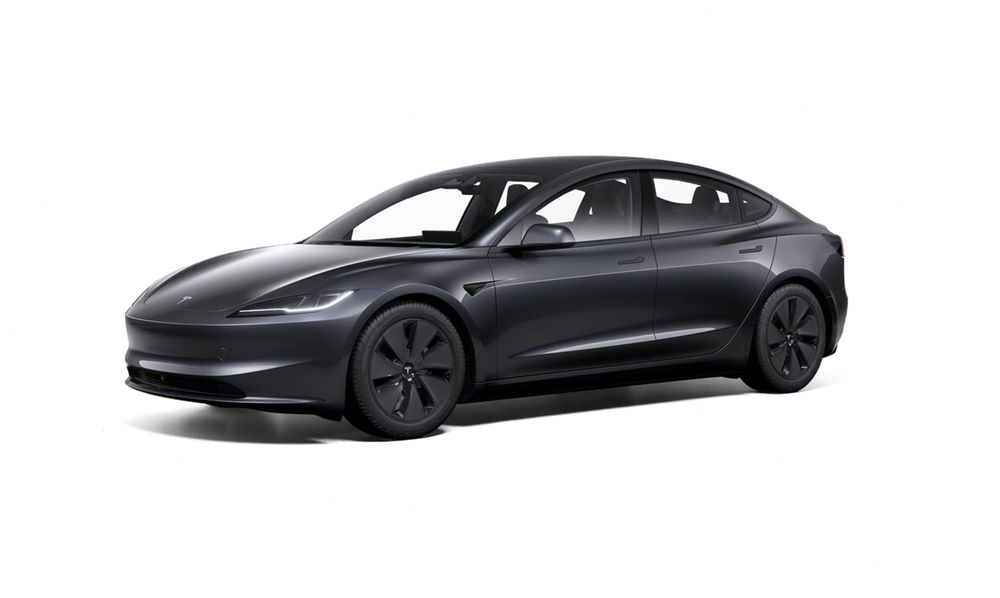

In [8]:
example = dataset["train"][80]
example["image"]

In [9]:
example["label"]

4

In [10]:
labels = dataset["train"].features["label"].names
print(labels)

['CHEVROLET_BOLT', 'KIA_NIRO', 'NISSAN_LEAF', 'RIVIAN_R1T', 'TESLA_3', 'TESLA_S', 'TESLA_X', 'TESLA_Y']


In [11]:
id2label = {k:v for k,v in enumerate(labels)}
label2id = {v:k for k,v in enumerate(labels)}
print(id2label)

{0: 'CHEVROLET_BOLT', 1: 'KIA_NIRO', 2: 'NISSAN_LEAF', 3: 'RIVIAN_R1T', 4: 'TESLA_3', 5: 'TESLA_S', 6: 'TESLA_X', 7: 'TESLA_Y'}


In [12]:
id2label[4]

'TESLA_3'

In [13]:
from transformers import AutoImageProcessor

In [14]:
image_processor = AutoImageProcessor.from_pretrained("facebook/convnextv2-tiny-1k-224")

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:140: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\User\.cache\huggingface\hub\models--facebook--convnextv2-tiny-1k-224. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


In [15]:
print(image_processor)

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}



In [22]:
from torchvision.transforms import (
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    ToTensor,
)

normalize = Normalize(mean=image_processor.image_mean, std=image_processor.image_std)

transform = Compose(
    [
     RandomResizedCrop(image_processor.size["shortest_edge"]),
     RandomHorizontalFlip(),
     ToTensor(),
     normalize
    ]
)

def train_transforms(examples):
  examples["pixel_values"] = [transform(image.convert("RGB")) for image in examples["image"]]

  return examples

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [23]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 160
    })
})

In [24]:
processed_dataset = dataset.with_transform(train_transforms)

In [25]:
processed_dataset["train"][0].keys()

dict_keys(['image', 'label', 'pixel_values'])

In [29]:
import torch
from torch.utils.data import DataLoader

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["label"] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}

dataloader = DataLoader(processed_dataset["train"], collate_fn=collate_fn, batch_size=4, shuffle=True)


In [30]:
batch = next(iter(dataloader))
for k,v in batch.items():
  print(k,v.shape)

pixel_values torch.Size([4, 3, 224, 224])
labels torch.Size([4])


In [31]:
from transformers import AutoModelForImageClassification

model = AutoModelForImageClassification.from_pretrained("facebook/convnextv2-tiny-1k-224",
                                                        id2label=id2label,
                                                        label2id=label2id,
                                                        ignore_mismatched_sizes=True)

Some weights of ConvNextV2ForImageClassification were not initialized from the model checkpoint at facebook/convnextv2-tiny-1k-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([8]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([8, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [33]:
from tqdm.notebook import tqdm
import torch

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)

# move model to GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

model.train()
for epoch in range(10):
  print("Epoch:", epoch)
  correct = 0
  total = 0
  for idx, batch in enumerate(dataloader):
    # move batch to GPU
    batch = {k:v.to(device) for k,v in batch.items()}

    optimizer.zero_grad()

    # forward pass
    outputs = model(pixel_values=batch["pixel_values"],
                    labels=batch["labels"])

    loss, logits = outputs.loss, outputs.logits
    loss.backward()
    optimizer.step()

    # metrics
    total += batch["labels"].shape[0]
    predicted = logits.argmax(-1)
    correct += (predicted == batch["labels"]).sum().item()

    accuracy = correct/total

    if idx % 100 == 0:
      print(f"Loss after {idx} steps:", loss.item())
      print(f"Accuracy after {idx} steps:", accuracy)

Epoch: 0
Loss after 0 steps: 2.0320935249328613
Accuracy after 0 steps: 0.25
Epoch: 1
Loss after 0 steps: 1.881575584411621
Accuracy after 0 steps: 0.25
Epoch: 2
Loss after 0 steps: 1.327357530593872
Accuracy after 0 steps: 0.5
Epoch: 3
Loss after 0 steps: 0.746637225151062
Accuracy after 0 steps: 1.0
Epoch: 4
Loss after 0 steps: 0.4431011974811554
Accuracy after 0 steps: 1.0
Epoch: 5
Loss after 0 steps: 0.47332286834716797
Accuracy after 0 steps: 1.0
Epoch: 6
Loss after 0 steps: 0.21711882948875427
Accuracy after 0 steps: 1.0
Epoch: 7
Loss after 0 steps: 1.2601791620254517
Accuracy after 0 steps: 0.5
Epoch: 8
Loss after 0 steps: 0.10755696147680283
Accuracy after 0 steps: 1.0
Epoch: 9
Loss after 0 steps: 0.4059326946735382
Accuracy after 0 steps: 0.75


In [1]:
from huggingface_hub import login

#login(token="hf_xxx")


In [2]:
repo_name = "dreamypancake/fine_tune_Car_ConvNeXTv2"

model.push_to_hub(repo_name)
image_processor.push_to_hub(repo_name)

NameError: name 'model' is not defined

In [3]:
from transformers import AutoImageProcessor, AutoModelForImageClassification

feature_extractor = AutoImageProcessor.from_pretrained("dreamypancake/fine_tune_Car_ConvNeXTv2")
model = AutoModelForImageClassification.from_pretrained("dreamypancake/fine_tune_Car_ConvNeXTv2")

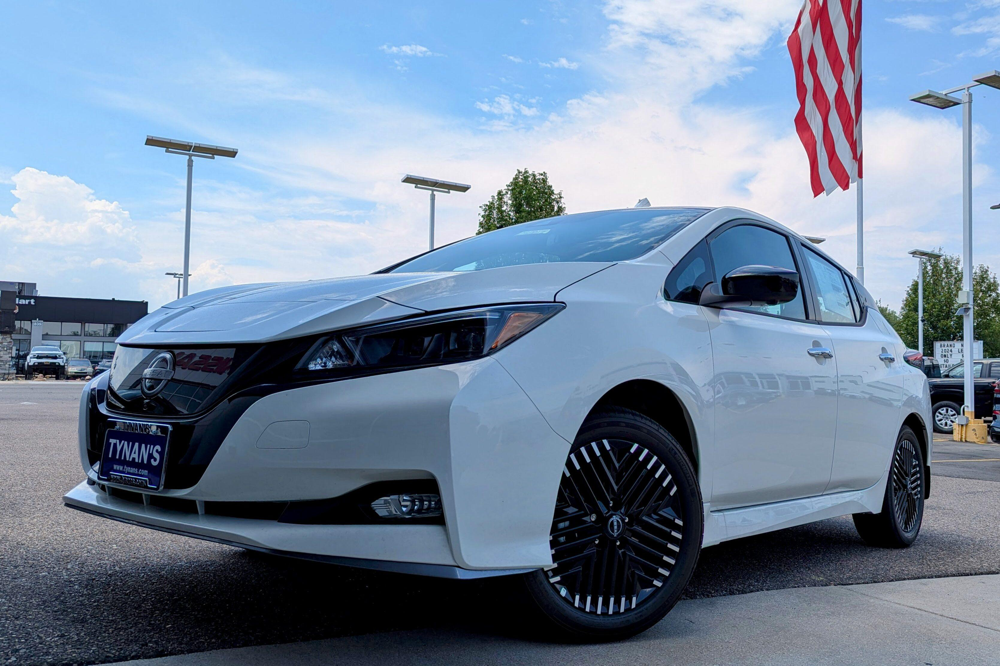

In [10]:


test_image = Image.open("../img/PXL_20240718_194708703.MP-EDIT-e1721954794964.jpg") 

test_image = test_image.convert("RGB")

test_image

In [1]:
import torch

In [2]:
from transformers import pipeline

pipe = pipeline(
    task="image-classification", 
    model="dreamypancake/fine_tune_Car_ConvNeXTv2",
    device="cuda" if torch.cuda.is_available() else "cpu",
)

In [3]:
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from PIL import Image
from tqdm import tqdm

In [4]:
def load_test_dataset(dataset_path=None, dataset_name=None, split="test"):
    """
    Load test dataset from various sources
    
    Args:
        dataset_path: Local path to dataset folder
        dataset_name: HuggingFace dataset name
        split: Dataset split to use
    """
    images = []
    labels = []
    class_names = []
        
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            class_names.append(class_name)
            for img_file in os.listdir(class_path):
                if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_path, img_file)
                    try:
                        img = Image.open(img_path).convert('RGB')
                        images.append(img)
                        labels.append(class_name)
                    except Exception as e:
                        print(f"Error loading {img_path}: {e}")
        
    return images, labels, class_names

In [5]:
def predict_batch(images, batch_size=32):
    """
    Predict labels for a batch of images
    """
    predictions = []
    
    for i in tqdm(range(0, len(images), batch_size), desc="Predicting"):
        batch = images[i:i+batch_size]
        batch_predictions = pipe(batch)
        
        # Extract the top prediction for each image
        for pred in batch_predictions:
            if isinstance(pred, list):
                # Multiple predictions per image, take the top one
                top_pred = max(pred, key=lambda x: x['score'])
                predictions.append(top_pred['label'])
            else:
                # Single prediction per image
                predictions.append(pred['label'])
    
    return predictions

In [49]:
def evaluate_model(images, true_labels, class_names):
    """
    Evaluate the model and create confusion matrix
    """
    print("Starting evaluation...")
    
    # Get predictions
    predicted_labels = predict_batch(images)
    
    # Calculate accuracy
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f"Accuracy: {accuracy:.4f}")
    
    # Get unique labels for confusion matrix
    all_labels = sorted(list(set(true_labels + predicted_labels)))
    
    # Create confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels, labels=all_labels)
    
    # Plot confusion matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=all_labels, yticklabels=all_labels)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig('../Results/car_confusionmatrix.png')
    plt.show()
    
    # Print classification report
    print("\nClassification Report:")
    print(classification_report(true_labels, predicted_labels))
    
    return cm, accuracy, predicted_labels

Loaded 40 images with 8 classes
Classes: ['CHEVROLET_BOLT', 'KIA_NIRO', 'NISSAN_LEAF', 'RIVIAN_R1T', 'TESLA_3', 'TESLA_S', 'TESLA_X', 'TESLA_Y']
Starting evaluation...


Predicting: 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]


Accuracy: 0.9500


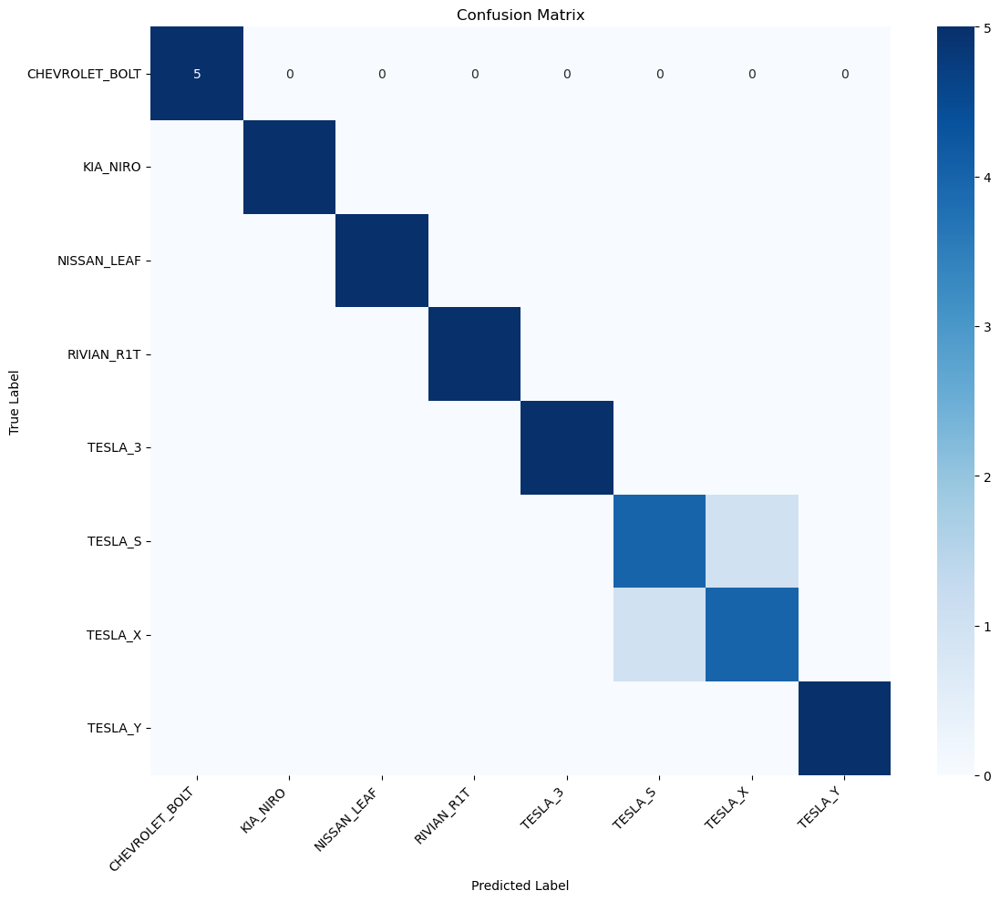


Classification Report:
                precision    recall  f1-score   support

CHEVROLET_BOLT       1.00      1.00      1.00         5
      KIA_NIRO       1.00      1.00      1.00         5
   NISSAN_LEAF       1.00      1.00      1.00         5
    RIVIAN_R1T       1.00      1.00      1.00         5
       TESLA_3       1.00      1.00      1.00         5
       TESLA_S       0.80      0.80      0.80         5
       TESLA_X       0.80      0.80      0.80         5
       TESLA_Y       1.00      1.00      1.00         5

      accuracy                           0.95        40
     macro avg       0.95      0.95      0.95        40
  weighted avg       0.95      0.95      0.95        40


Total samples: 40
Correct predictions: 38
Incorrect predictions: 2


In [50]:
images, labels, class_names = load_test_dataset(dataset_path="../img/test")

print(f"Loaded {len(images)} images with {len(class_names)} classes")
print(f"Classes: {class_names}")

cm, accuracy, predictions = evaluate_model(images, labels, class_names)
    
# Additional analysis
print(f"\nTotal samples: {len(images)}")
print(f"Correct predictions: {sum(1 for t, p in zip(labels, predictions) if t == p)}")
print(f"Incorrect predictions: {sum(1 for t, p in zip(labels, predictions) if t != p)}")